In [1]:
import boto3
import io
import pandas as pd
import numpy as np
from PIL.Image import Image
import matplotlib.pyplot as plt
from utils.plot import plot_image, load_tiny_batch, plot_images_grid, draw_boxes

%config InlineBackend.figure_format = 'retina'

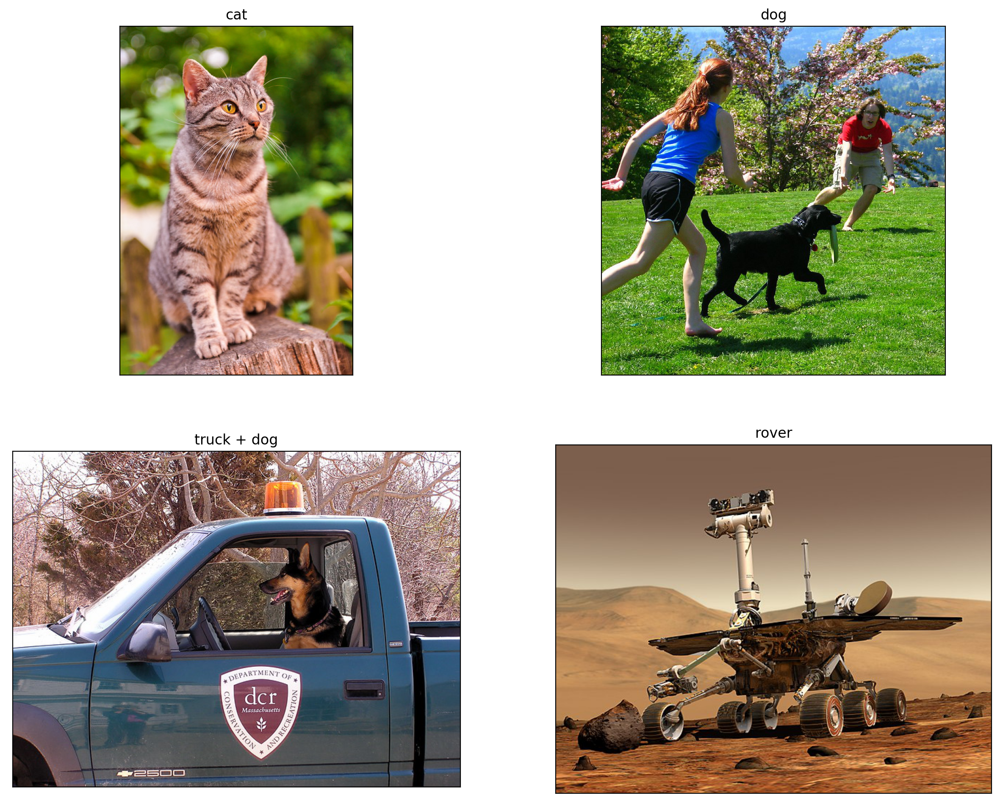

In [2]:
# Loads a tiny batch of images from Internet
images_raw = load_tiny_batch()
plot_images_grid(images_raw)

In [3]:
def detect_objects(image: Image):
    image_bytes = io.BytesIO()
    image.save(image_bytes, format='PNG')
    image_bytes = image_bytes.getvalue()

    client = boto3.client('rekognition')
    response = client.detect_labels(
        Image={
            'Bytes': image_bytes
        }
    )
    
    summary = pd.DataFrame([
        {
            'Name': r['Name'], 
            'Confidence': r['Confidence'], 
            'Instances': len(r['Instances'])
        } 
        for r in response['Labels']
    ])
    
    boxes = []
    class_names = []
    scores = []
    for label in response['Labels']:
        for instance in label['Instances']:
            class_names.append(label['Name'])
            scores.append(instance['Confidence'] / 100)
            boxes.append((
                instance['BoundingBox']['Top'],
                instance['BoundingBox']['Left'],
                (instance['BoundingBox']['Top'] + instance['BoundingBox']['Height']),
                (instance['BoundingBox']['Left'] + instance['BoundingBox']['Width'])
            ))
            
    image = draw_boxes(np.array(image), np.array(boxes), class_names, scores)
    return image, summary

,Name,Confidence,Instances
0,Abyssinian,98.059967,0
1,Cat,98.059967,1
2,Pet,98.059967,0
3,Mammal,98.059967,0
4,Animal,98.059967,0
5,Manx,87.599403,0
6,Panther,60.697685,1
7,Wildlife,60.697685,0
8,Jaguar,60.697685,0
9,Leopard,60.697685,0


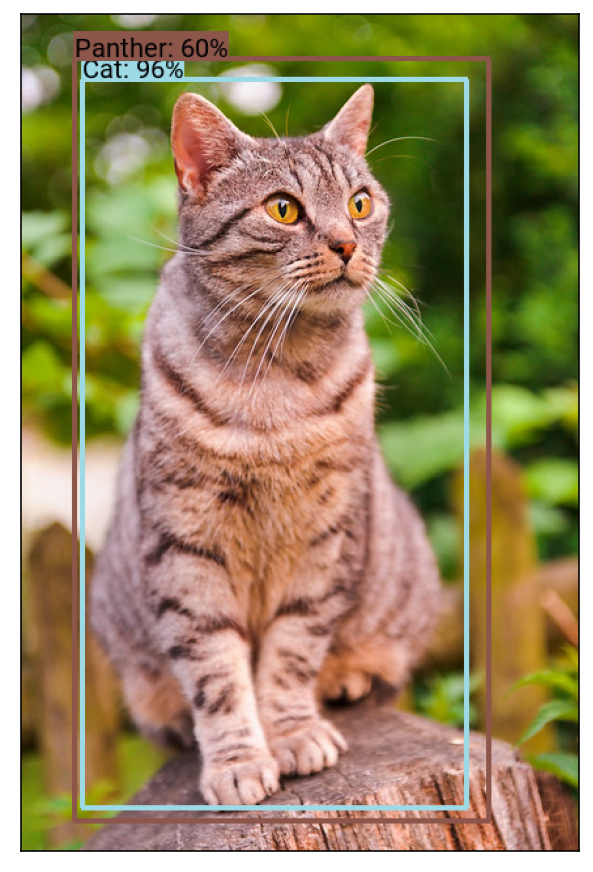

In [5]:
image, summary = detect_objects(images_raw['cat'])
plot_image(image, figsize=[5, 10])
summary

,Name,Confidence,Instances
0,Grass,99.949379,0
1,Plant,99.949379,0
2,Person,99.773643,2
3,Human,99.773643,0
4,Dog,98.986092,1
5,Canine,98.986092,0
6,Pet,98.986092,0
7,Mammal,98.986092,0
8,Animal,98.986092,0
9,Shorts,95.646469,0


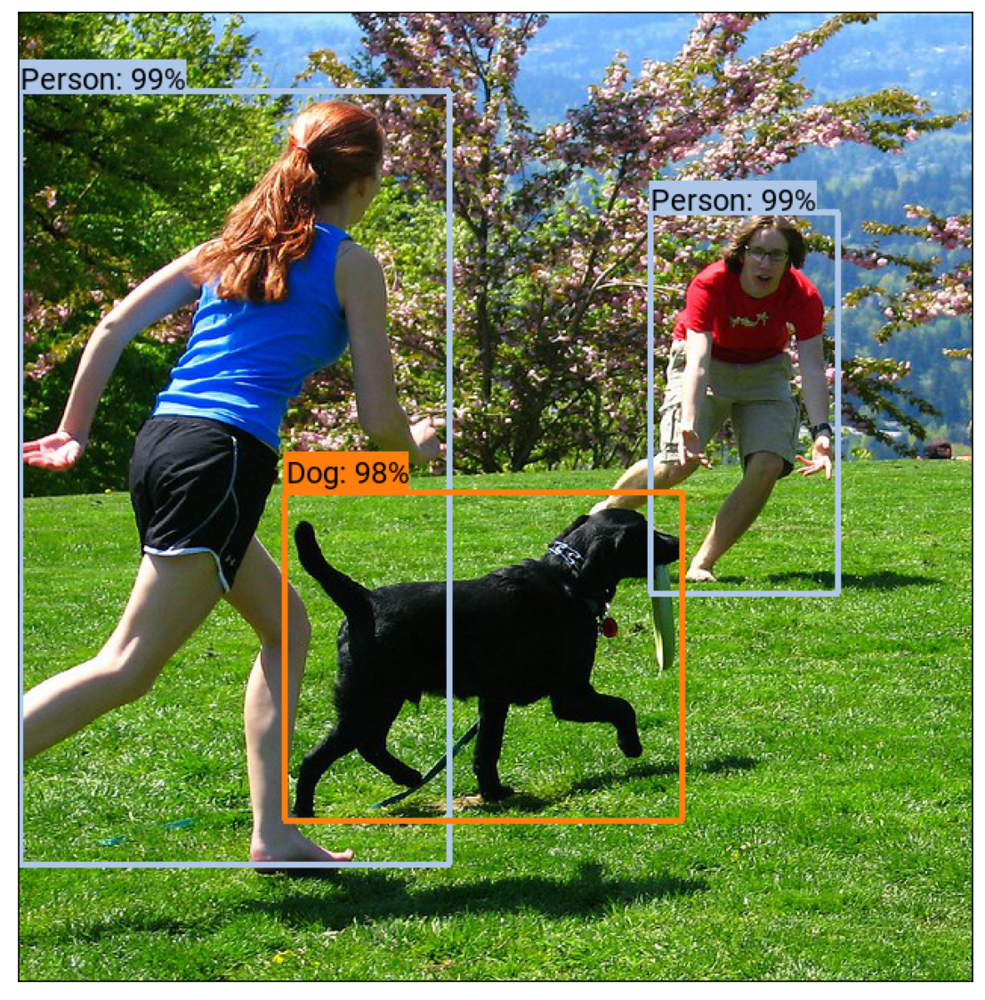

In [6]:
image, summary = detect_objects(images_raw['dog'])
plot_image(image, figsize=[10, 10])
summary

,Name,Confidence,Instances
0,Dog,95.958649,1
1,Pet,95.958649,0
2,Animal,95.958649,0
3,Mammal,95.958649,0
4,Canine,95.958649,0
5,Car,89.402626,1
6,Automobile,89.402626,0
7,Vehicle,89.402626,0
8,Transportation,89.402626,0
9,Truck,80.321678,1


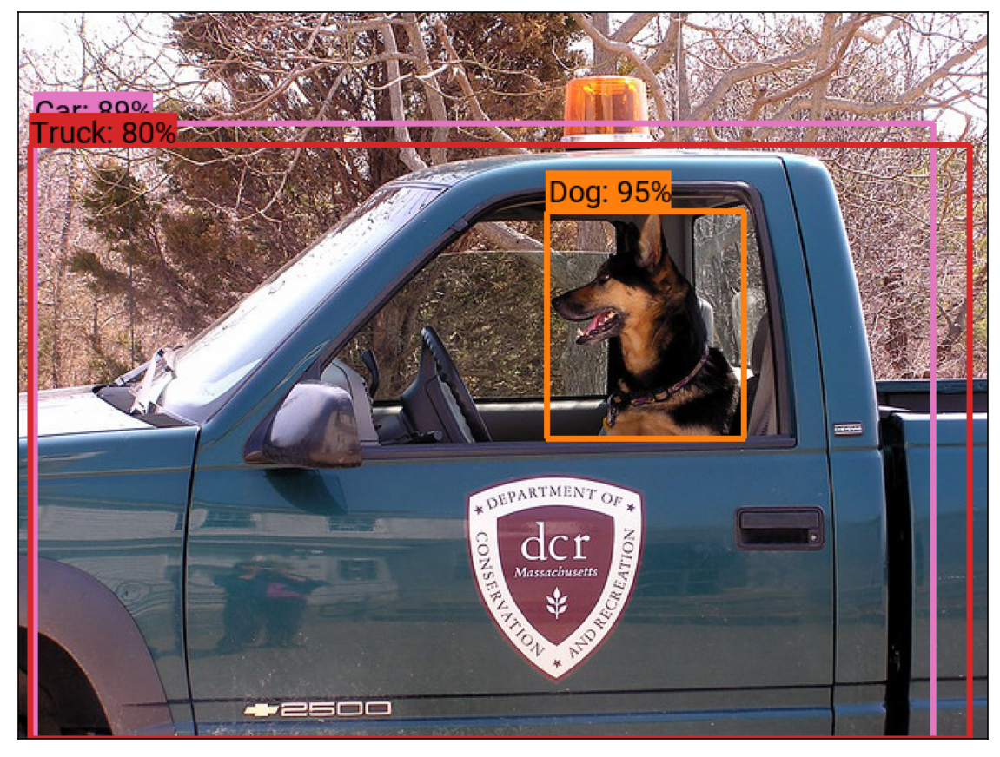

In [7]:
image, summary = detect_objects(images_raw['truck + dog'])
plot_image(image, figsize=[10, 10])
summary

,Name,Confidence,Instances
0,Soil,96.534088,0
1,Nature,94.128456,0
2,Outdoors,90.798630,0
3,Sand,87.998291,0
4,Sphere,84.597885,0
5,Outer Space,79.166512,0
6,Space,79.166512,0
7,Universe,79.166512,0
8,Astronomy,79.166512,0
9,Bird,77.480492,2


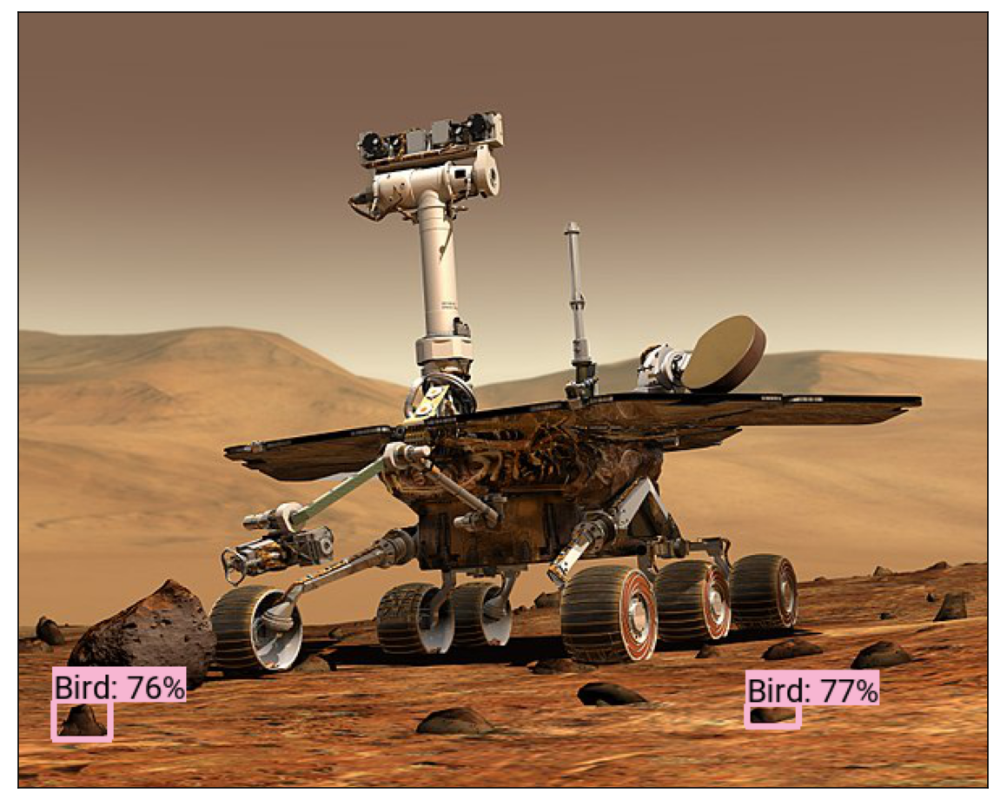

In [8]:
image, summary = detect_objects(images_raw['rover'])
plot_image(image, figsize=[10, 10])
summary